# Winter 2025 MATH 509 PROJECT

- Phong Ho
- Michael Zhang
- R.J. Bilak

------------------------

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import scipy.stats as stats

# EDA

In [2]:
data = 'https://raw.githubusercontent.com/whosphong/DATA-STRUCTURES-AND-PLATFORMS---UAmath509/refs/heads/main/google_review_ratings.csv'
df = pd.read_csv(data)

In [3]:
df.head(20)
df.tail(20)

df.drop(columns=['User', 'Unnamed: 25'], inplace=True)

In [ ]:
## Checking types of Data

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5454 entries, 0 to 5453
Data columns (total 24 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Category 1   5454 non-null   float64
 1   Category 2   5454 non-null   float64
 2   Category 3   5454 non-null   float64
 3   Category 4   5454 non-null   float64
 4   Category 5   5454 non-null   float64
 5   Category 6   5454 non-null   float64
 6   Category 7   5454 non-null   float64
 7   Category 8   5454 non-null   float64
 8   Category 9   5454 non-null   float64
 9   Category 10  5454 non-null   float64
 10  Category 11  5454 non-null   float64
 11  Category 12  5454 non-null   float64
 12  Category 13  5454 non-null   float64
 13  Category 14  5454 non-null   float64
 14  Category 15  5454 non-null   float64
 15  Category 16  5454 non-null   float64
 16  Category 17  5454 non-null   float64
 17  Category 18  5454 non-null   float64
 18  Category 19  5454 non-null   float64
 19  Catego

In [7]:
df.describe()

,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10,...,Category 15,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24
count,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,...,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000,5454.000000
mean,1.455746,2.320048,2.489059,2.797103,2.958904,2.893423,3.351476,2.541177,3.126542,2.832695,...,2.206140,1.192710,0.949349,0.822525,0.969250,0.999626,0.965275,1.749345,1.531051,1.560570
std,0.827732,1.421576,1.247503,1.309188,1.338785,1.282101,1.413291,1.111398,1.356774,1.307299,...,1.715848,1.107176,0.973628,0.948015,1.202883,1.193129,0.928326,1.597816,1.316180,1.171784
min,0.000000,0.000000,0.000000,0.830000,1.120000,1.110000,1.120000,0.860000,0.840000,0.810000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.920000,1.360000,1.540000,1.730000,1.770000,1.790000,1.930000,1.620000,1.800000,1.640000,...,0.860000,0.690000,0.580000,0.530000,0.520000,0.540000,0.570000,0.740000,0.790000,0.880000
50%,1.340000,1.910000,2.060000,2.460000,2.670000,2.680000,3.230000,2.170000,2.800000,2.680000,...,1.330000,0.800000,0.740000,0.690000,0.690000,0.690000,0.760000,1.030000,1.070000,1.290000
75%,1.810000,2.687500,2.740000,4.097500,4.310000,3.837500,5.000000,3.190000,5.000000,3.527500,...,4.440000,1.160000,0.910000,0.840000,0.860000,0.860000,1.000000,2.070000,1.560000,1.660000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [10]:
df = df.rename(columns = {"Category 1": "C1", "Category 2": "C2", "Category 3": "C3", "Category 4": "C4", "Category 5": "C5", 
                          "Category 6": "C6", "Category 7": "C7", "Category 8": "C8", "Category 9": "C9", "Category 10": "C10", 
                          "Category 11": "C11", "Category 12": "C12", "Category 13": "C13", "Category 14": "C14", "Category 15": "C15", "Category 16": "C16", 
                          "Category 17": "C17", "Category 18": "C18", "Category 19": "C19", "Category 20": "C20", "Category 21": "C21", "Category 22": "C22", 
                          "Category 23": "C23", "Category 24": "C24"}).copy()

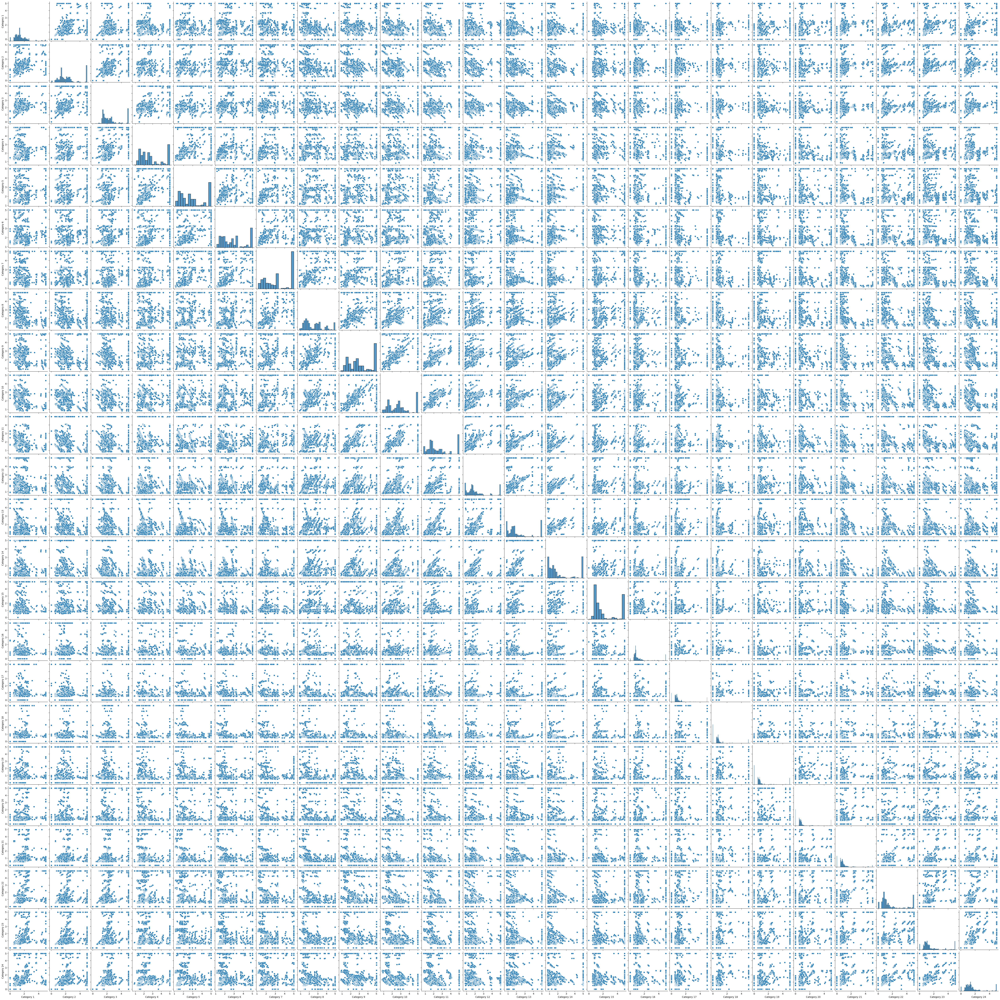

In [9]:
sns.pairplot(df)

In [ ]:
df.isna().sum() ## None

dup_df = df[df.duplicated()] ## Indicates 4,674,1346 are duplicates

df.iloc[[4,674,1346],:] ## Does not show any duplicates

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,...,C15,C16,C17,C18,C19,C20,C21,C22,C23,C24
4,0.00,0.0,3.63,3.63,5.00,2.92,5.00,2.64,2.33,2.64,...,1.74,0.59,0.5,0.0,0.50,0.0,0.0,0.00,0.00,0.00
674,0.00,0.0,1.45,1.43,1.42,1.43,1.48,1.48,2.72,2.73,...,5.00,0.81,0.8,5.0,0.92,0.0,0.0,0.00,0.00,0.00
1346,1.06,1.1,5.00,3.28,5.00,5.00,5.00,1.84,1.81,5.00,...,1.77,1.80,0.0,0.0,0.00,0.0,0.0,1.05,1.03,1.04


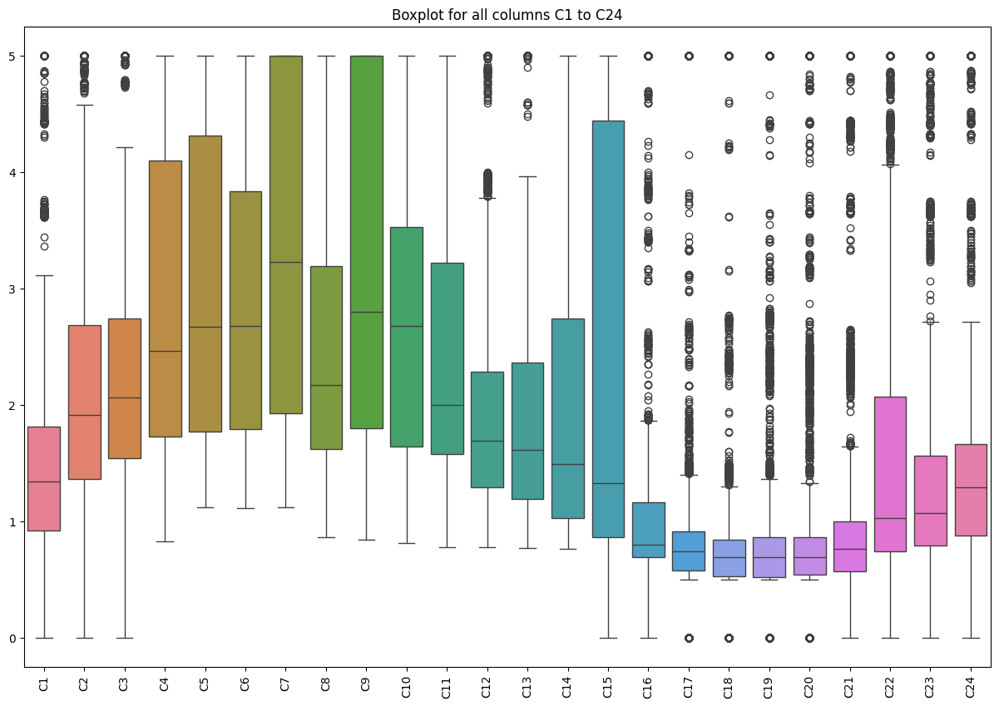

In [24]:
plt.figure(figsize=(15, 10))
sns.boxplot(data=df)
plt.xticks(rotation=90)
plt.title('Boxplot for all columns C1 to C24')
plt.show()

In [ ]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

# df = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)] ## Removing Outliers

C1     0.8900
C2     1.3275
C3     1.2000
C4     2.3675
C5     2.5400
C6     2.0475
C7     3.0700
C8     1.5700
C9     3.2000
C10    1.8875
C11    1.6375
C12    0.9975
C13    1.1700
C14    1.7100
C15    3.5800
C16    0.4700
C17    0.3300
C18    0.3100
C19    0.3400
C20    0.3200
C21    0.4300
C22    1.3300
C23    0.7700
C24    0.7800
dtype: float64


,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,...,C15,C16,C17,C18,C19,C20,C21,C22,C23,C24
C1,1.000000,0.248970,0.149097,0.070810,0.035677,-0.092964,-0.264541,-0.181291,-0.290303,-0.274588,...,-0.135066,0.067343,0.130020,0.160288,0.180213,0.199331,0.309477,0.364726,0.407106,0.489249
C2,0.248970,1.000000,0.325429,0.167332,0.153719,0.054090,-0.050117,-0.004703,-0.050811,-0.092441,...,-0.066598,-0.033044,-0.077300,-0.025568,0.032717,0.097168,0.089356,0.018869,0.077744,0.125254
C3,0.149097,0.325429,1.000000,0.396694,0.329425,0.160567,-0.073423,-0.186372,-0.219795,-0.180092,...,-0.133955,-0.022477,-0.084304,-0.119516,-0.074712,-0.008469,0.002149,0.134288,0.118349,0.082810
C4,0.070810,0.167332,0.396694,1.000000,0.626787,0.315107,-0.068372,-0.128352,-0.169703,-0.116054,...,-0.271844,0.018217,-0.132399,-0.183780,-0.192069,-0.091816,-0.055253,0.277319,0.174384,0.090754
C5,0.035677,0.153719,0.329425,0.626787,1.000000,0.489528,0.077164,-0.002728,-0.170545,-0.101121,...,-0.323627,-0.056550,-0.184121,-0.243168,-0.256297,-0.191270,-0.132344,0.124517,0.129130,0.099094
C6,-0.092964,0.054090,0.160567,0.315107,0.489528,1.000000,0.382338,0.200532,0.114800,-0.019901,...,-0.187154,-0.149552,-0.229388,-0.271169,-0.265931,-0.226674,-0.196501,-0.090693,-0.080253,-0.066224
C7,-0.264541,-0.050117,-0.073423,-0.068372,0.077164,0.382338,1.000000,0.406966,0.432183,0.255999,...,0.093076,-0.143057,-0.207111,-0.226317,-0.272284,-0.231715,-0.256882,-0.360561,-0.222391,-0.247402
C8,-0.181291,-0.004703,-0.186372,-0.128352,-0.002728,0.200532,0.406966,1.000000,0.536705,0.551613,...,-0.064381,-0.124401,-0.203083,-0.236215,-0.280711,-0.254095,-0.274424,-0.255060,-0.167595,-0.137126
C9,-0.290303,-0.050811,-0.219795,-0.169703,-0.170545,0.114800,0.432183,0.536705,1.000000,0.564442,...,0.127070,-0.119796,-0.229793,-0.266880,-0.271680,-0.163753,-0.185619,-0.267527,-0.268188,-0.326456
C10,-0.274588,-0.092441,-0.180092,-0.116054,-0.101121,-0.019901,0.255999,0.551613,0.564442,1.000000,...,0.038642,-0.032137,-0.212123,-0.273656,-0.323441,-0.246766,-0.229392,-0.183937,-0.212255,-0.263339


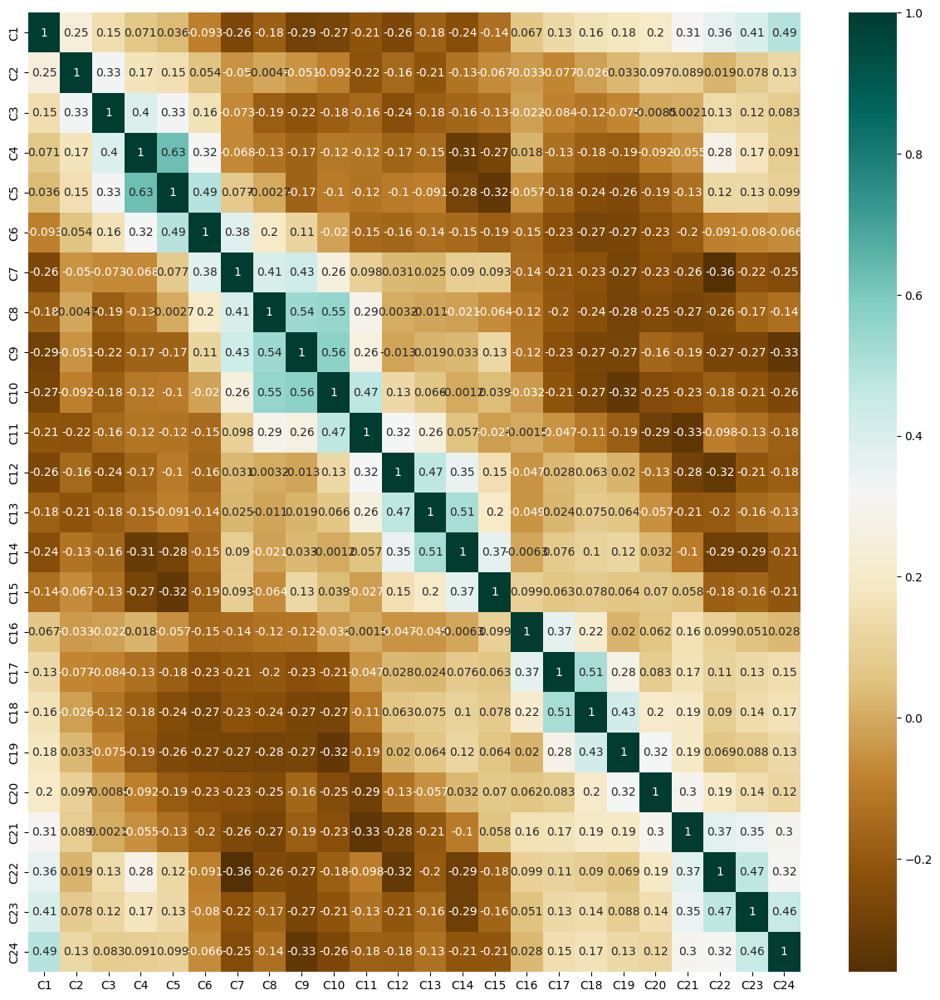

In [28]:
plt.figure(figsize=(15,15))
c= df.corr()
sns.heatmap(c,cmap="BrBG",annot=True)
c